# Featurization, Model Selection, and Tuning Project

## Problem Statement

- Context
  - The Thera bank recently saw a steep decline in the number of users of their credit card, credit cards are a good source of income for banks because of different kinds of fees charged by the banks like annual fees, balance transfer fees, and cash advance fees, late payment fees, foreign transaction fees, and others. Some fees are charged to every user irrespective of usage, while others are charged under specified circumstances.

 

- Objective

  
  - Customers’ leaving credit card services would lead the bank to loss, so the bank wants to analyze the data of customers and identify the customers who will leave their credit card services and the reason for same – so that the bank could improve upon those areas.

You as a Data Scientist at Thera Bank need to explore the data provided, identify patterns, and come up with a classification model to identify customers likely to churn, and provide actionable insights and recommendations that will help the bank improve its services so that customers do not renounce their credit cards.

### Let us start by importing the required libraries.

In [5]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.metrics import classification_report, accuracy_score, roc_auc_score, confusion_matrix
import warnings
warnings.filterwarnings('ignore')

In [6]:
#Load the dataset
df = pd.read_csv('BankChurners.csv')

In [7]:
df.sample(5)

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
9272,712256358,Existing Customer,40,M,3,Graduate,Married,$60K - $80K,Blue,23,...,3,1,22729.0,1581,21148.0,1.025,13672,110,0.746,0.070
4216,715093383,Existing Customer,49,F,2,College,Married,Less than $40K,Blue,41,...,1,3,2115.0,1598,517.0,0.934,4450,68,0.545,0.756
5269,789097833,Existing Customer,39,F,0,High School,Single,Less than $40K,Blue,27,...,3,3,3927.0,720,3207.0,0.630,4230,93,0.898,0.183
3957,717483558,Existing Customer,42,M,3,High School,Married,$120K +,Blue,36,...,1,2,19156.0,1353,17803.0,1.410,3547,61,0.649,0.071
9973,721005108,Existing Customer,41,M,0,College,Married,$40K - $60K,Blue,29,...,2,2,6991.0,1384,5607.0,0.660,14994,104,0.733,0.198


# Exploratory Data Analysis

In [9]:
#get the information about the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           8608 non-null   object 
 6   Marital_Status            9378 non-null   object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

Observations
   - No.of columns = 21
   - No.of data points = 10,127
   - Different data types in the dataset: float64(5), int64(10), object(6)

In [11]:
# Check for missing values
df.isnull().sum()

CLIENTNUM                      0
Attrition_Flag                 0
Customer_Age                   0
Gender                         0
Dependent_count                0
Education_Level             1519
Marital_Status               749
Income_Category                0
Card_Category                  0
Months_on_book                 0
Total_Relationship_Count       0
Months_Inactive_12_mon         0
Contacts_Count_12_mon          0
Credit_Limit                   0
Total_Revolving_Bal            0
Avg_Open_To_Buy                0
Total_Amt_Chng_Q4_Q1           0
Total_Trans_Amt                0
Total_Trans_Ct                 0
Total_Ct_Chng_Q4_Q1            0
Avg_Utilization_Ratio          0
dtype: int64

Observations:
 - Education_Level: 1519 missing values(approximately 15% of the dataset)
 - Martial_status: 749 missing values(approximately 7.4% of the dataset)

In [13]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
CLIENTNUM,10127.0,7.391776e+08,3.690378e+07,708082083.0,7.130368e+08,7.179264e+08,7.731435e+08,8.283431e+08
Customer_Age,10127.0,4.632596e+01,8.016814e+00,26.0,4.100000e+01,4.600000e+01,5.200000e+01,7.300000e+01
Dependent_count,10127.0,2.346203e+00,1.298908e+00,0.0,1.000000e+00,2.000000e+00,3.000000e+00,5.000000e+00
Months_on_book,10127.0,3.592841e+01,7.986416e+00,13.0,3.100000e+01,3.600000e+01,4.000000e+01,5.600000e+01
Total_Relationship_Count,10127.0,3.812580e+00,1.554408e+00,1.0,3.000000e+00,4.000000e+00,5.000000e+00,6.000000e+00
Months_Inactive_12_mon,10127.0,2.341167e+00,1.010622e+00,0.0,2.000000e+00,2.000000e+00,3.000000e+00,6.000000e+00
Contacts_Count_12_mon,10127.0,2.455317e+00,1.106225e+00,0.0,2.000000e+00,2.000000e+00,3.000000e+00,6.000000e+00
Credit_Limit,10127.0,8.631954e+03,9.088777e+03,1438.3,2.555000e+03,4.549000e+03,1.106750e+04,3.451600e+04
Total_Revolving_Bal,10127.0,1.162814e+03,8.149873e+02,0.0,3.590000e+02,1.276000e+03,1.784000e+03,2.517000e+03
Avg_Open_To_Buy,10127.0,7.469140e+03,9.090685e+03,3.0,1.324500e+03,3.474000e+03,9.859000e+03,3.451600e+04


In [14]:
# Check for duplicate rows
df.duplicated().sum()

0

Observations:
- There are no duplicate rows.
  

## Handling Missing Values

- It is better to handle the missing values before we proceed with the univariate and bivariate analysis to avoid biased analysis or visualization issues.
  

In [18]:
#let us  see the different values in education level and marital status columns
df['Education_Level'].value_counts()

Education_Level
Graduate         3128
High School      2013
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: count, dtype: int64

In [19]:
df['Marital_Status'].value_counts()

Marital_Status
Married     4687
Single      3943
Divorced     748
Name: count, dtype: int64

##### As the number of missing values is more in both columns, it is not an appropriate choice to drop these rows or data points since we might lose out on some important information that might help the models identify the underlying patterns.

##### So, it is better to create a separate category as 'Unknown' rather than imputing it with the mode.

In [22]:
df['Education_Level'].fillna(value = 'Unknown', inplace = True)
df['Marital_Status'].fillna(value = 'Unknown', inplace = True)

In [23]:
df.sample(10)

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
9839,721145433,Existing Customer,52,F,5,High School,Single,Less than $40K,Silver,36,...,2,2,11280.0,1523,9757.0,0.765,16237,128,0.753,0.135
2312,825756333,Existing Customer,55,F,0,Uneducated,Married,Less than $40K,Blue,51,...,3,1,2041.0,1885,156.0,0.587,2118,48,0.778,0.924
7010,790108908,Existing Customer,44,M,2,Post-Graduate,Married,$80K - $120K,Blue,37,...,1,1,34058.0,0,34058.0,0.552,4043,57,0.781,0.000
2448,709616958,Existing Customer,38,M,2,High School,Single,$60K - $80K,Silver,30,...,3,4,26556.0,1583,24973.0,0.694,3168,73,0.738,0.060
2535,716378658,Existing Customer,55,F,2,Unknown,Married,Less than $40K,Blue,36,...,2,3,2629.0,1476,1153.0,0.537,1725,41,0.414,0.561
9047,718353633,Attrited Customer,50,M,1,Post-Graduate,Unknown,$80K - $120K,Gold,36,...,3,2,34516.0,0,34516.0,1.032,5547,75,0.744,0.000
109,708476808,Existing Customer,54,M,4,Unknown,Divorced,$120K +,Blue,36,...,3,2,33791.0,1960,31831.0,0.618,1047,31,0.824,0.058
9780,708694983,Existing Customer,55,F,1,Uneducated,Unknown,Less than $40K,Blue,36,...,2,1,3150.0,2222,928.0,0.794,14750,96,0.655,0.705
1331,717268458,Existing Customer,61,M,0,Graduate,Married,$60K - $80K,Blue,49,...,3,4,3352.0,1713,1639.0,0.657,1952,50,0.667,0.511
1931,780998133,Existing Customer,43,M,3,Graduate,Married,$80K - $120K,Blue,34,...,4,4,10540.0,1489,9051.0,1.029,1980,45,0.607,0.141


In [24]:
#Extracting just categorical columns
Categorical_cols = df.select_dtypes(include = 'object')

In [25]:
categorical_columns = list(Categorical_cols.columns)

In [26]:
categorical_columns

['Attrition_Flag',
 'Gender',
 'Education_Level',
 'Marital_Status',
 'Income_Category',
 'Card_Category']

In [27]:
for i in categorical_columns:
    print(df[i].value_counts())
    print('-'*50)

Attrition_Flag
Existing Customer    8500
Attrited Customer    1627
Name: count, dtype: int64
--------------------------------------------------
Gender
F    5358
M    4769
Name: count, dtype: int64
--------------------------------------------------
Education_Level
Graduate         3128
High School      2013
Unknown          1519
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: count, dtype: int64
--------------------------------------------------
Marital_Status
Married     4687
Single      3943
Unknown      749
Divorced     748
Name: count, dtype: int64
--------------------------------------------------
Income_Category
Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
abc               1112
$120K +            727
Name: count, dtype: int64
--------------------------------------------------
Card_Category
Blue        9436
Silver       555
Gold         116
Platinum      20
Name: count, dtype: int64
------

Observations:
 - The category 'abc' in the Income_Category column seems suspicious and could be an invalid or placeholder value. It’s crucial to address it to avoid impacting the analysis or model performance.
 - Let us replace 'abc' with the mode (Less than $40K), as it is the most frequent and likely represents the majority income level.

In [29]:
df['Income_Category'] = df['Income_Category'].replace('abc','Less than $40K')

In [30]:
#Let us verify if the replacement is done correctly.
df['Income_Category'].value_counts()

Income_Category
Less than $40K    4673
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
$120K +            727
Name: count, dtype: int64

In [31]:
df['CLIENTNUM'].value_counts()

CLIENTNUM
768805383    1
711784908    1
720133908    1
803197833    1
812222208    1
            ..
796903083    1
716014983    1
712521783    1
780045708    1
714337233    1
Name: count, Length: 10127, dtype: int64

In [32]:
# CLIETNUM does not add any information to our analysis so it is better to dropt his column.
df.drop(columns = ['CLIENTNUM'],axis =1, inplace = True)

In [33]:
df.sample(5)

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
5593,Existing Customer,53,F,3,Graduate,Married,Less than $40K,Blue,35,4,3,1,3390.0,2180,1210.0,0.877,4585,78,0.950,0.643
1010,Existing Customer,43,F,2,Uneducated,Single,$40K - $60K,Blue,29,6,3,2,2162.0,1377,785.0,0.600,1555,29,0.706,0.637
3451,Existing Customer,48,F,2,High School,Single,Less than $40K,Blue,36,3,3,3,5483.0,535,4948.0,0.681,2051,49,0.633,0.098
1978,Existing Customer,38,F,1,Graduate,Married,$40K - $60K,Blue,20,5,1,3,5153.0,2517,2636.0,1.488,3095,63,0.969,0.488
871,Existing Customer,44,M,3,Unknown,Married,$60K - $80K,Blue,37,3,2,3,6224.0,0,6224.0,0.738,1463,34,0.889,0.000


### The data is now clean and ready for analysis.

## Univariate Analysis

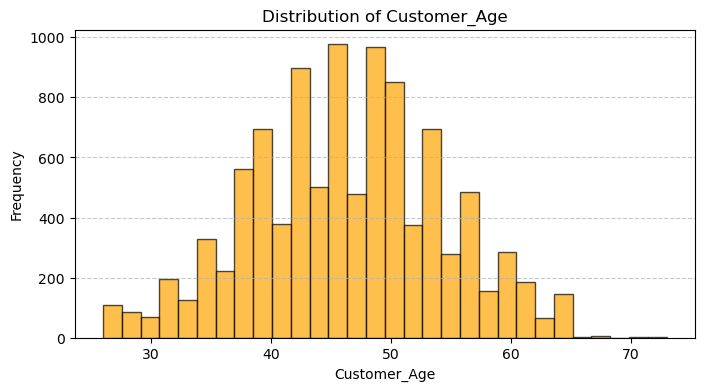

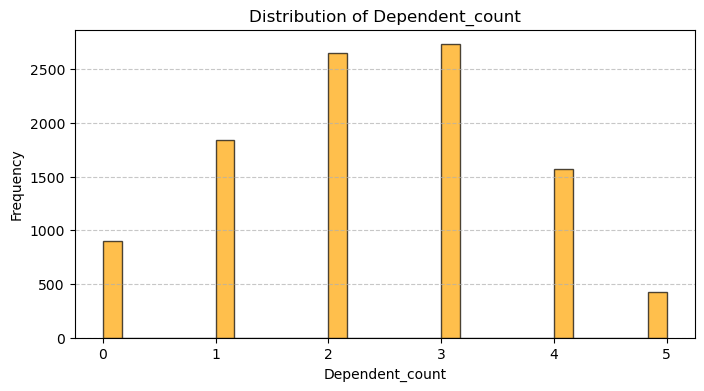

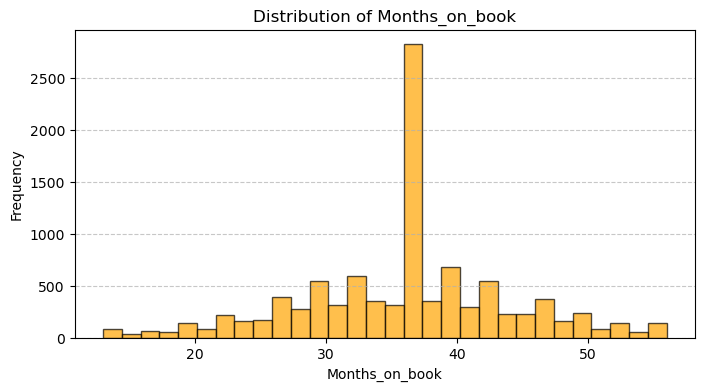

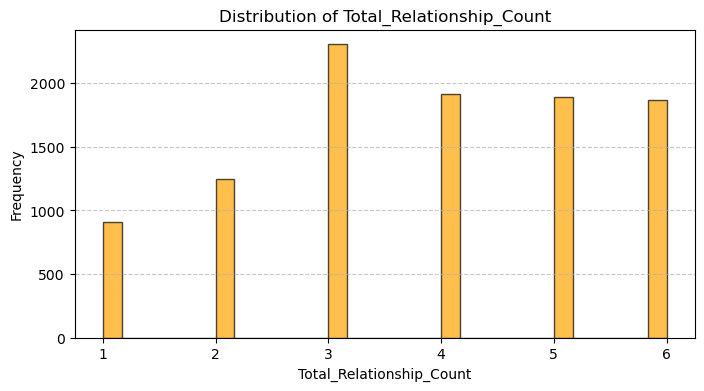

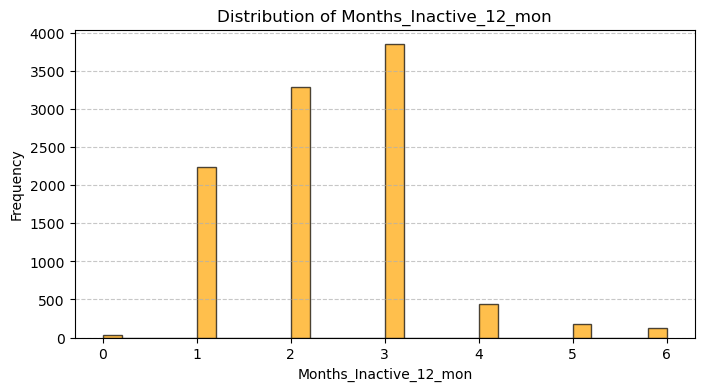

...

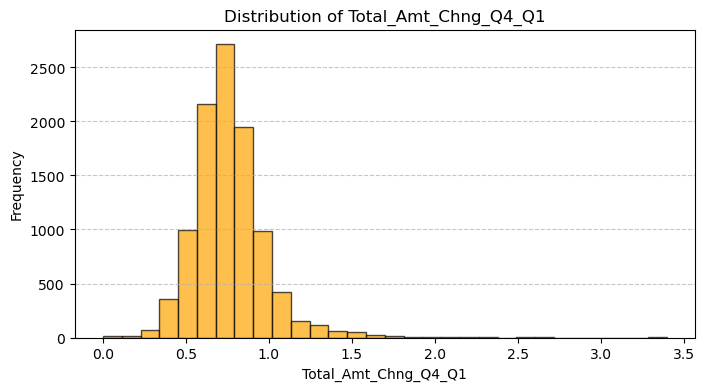

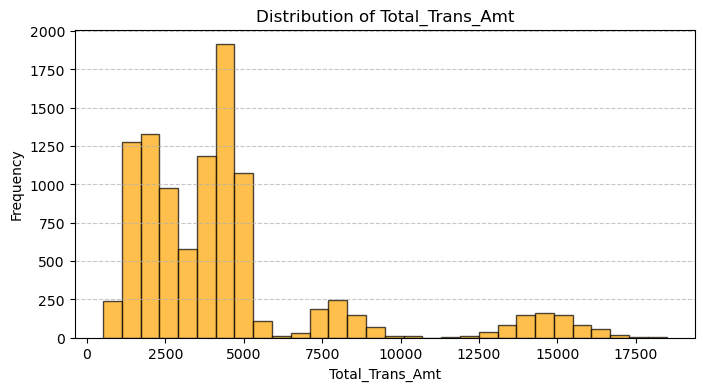

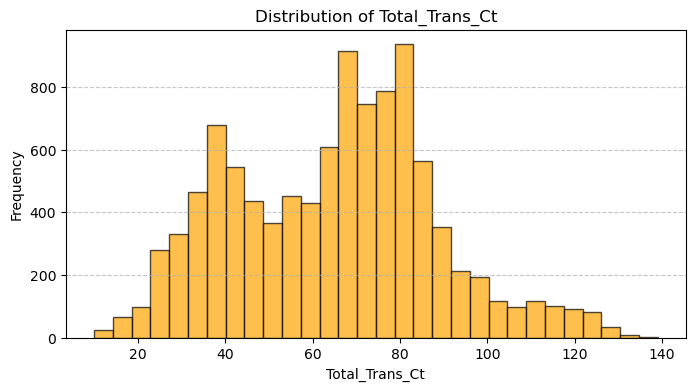

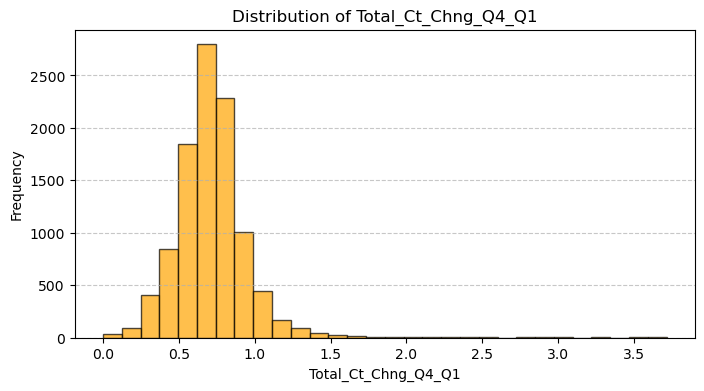

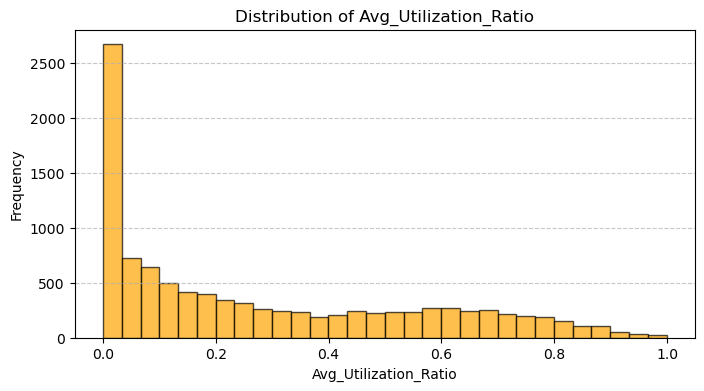

In [36]:
# Let us first analyze numerical columns

# Select numerical columns for univariate analysis
numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns

# Plot histograms for numerical columns
for column in numerical_columns:
    plt.figure(figsize=(8, 4))
    plt.hist(df[column], bins=30, color='orange', alpha=0.7, edgecolor='black')
    plt.title(f"Distribution of {column}")
    plt.xlabel(column)
    plt.ylabel("Frequency")
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()


Observation:
- Customer_Age: The distribution is approximately normal, with most customers aged between 40 and 50.
- Credit_Limit: Highly skewed, with the majority of customers having a credit limit below 10,000.
- Avg_Open_To_Buy: Similar to Credit_Limit, most values are concentrated at lower levels.
- Total_Trans_Ct: The data appears bimodal, with two peaks around 60–70 and 70–90 transactions.
- Total_Trans_Amt: Skewed, with a significant concentration of customers at lower transaction amounts.
- Avg_Utilization_Ratio: Skewed, with most values concentrated near zero, indicating low credit usage.
- Months_on_book: Normal distribution centered around 35–40 months.
- Months_Inactive_12_mon: Peaks at 2–3 months, suggesting many customers were inactive for only a short period.
- Total_Amt_Chng_Q4_Q1: Mostly centered around 0.5–1.0, showing little variation in transaction amounts between the two quarters.

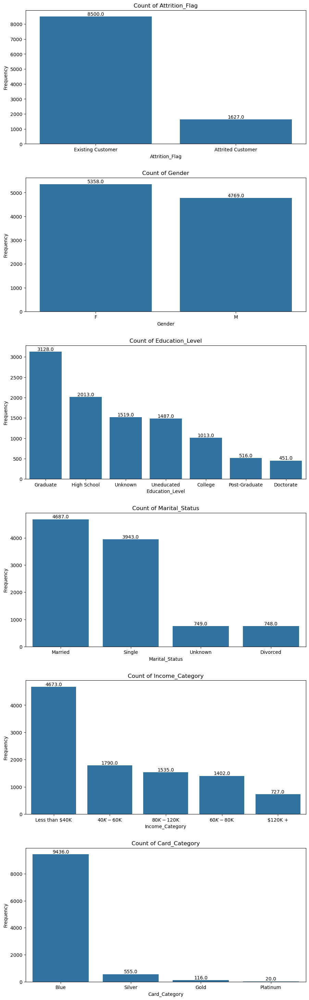

In [38]:
fig, axes = plt.subplots(len(categorical_columns), 1, figsize=(10, len(categorical_columns) * 5))
fig.tight_layout(pad=5.0)

for i, col in enumerate(categorical_columns):
    sns.countplot(data=df, x=col, order=df[col].value_counts().index, ax=axes[i])
    axes[i].set_title(f"Count of {col}")
    axes[i].set_xlabel(col)
    axes[i].set_ylabel("Frequency")
    for p in axes[i].patches:  # Adding labels on bars
        axes[i].annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                         ha='center', va='center', fontsize=10, color='black', xytext=(0, 5), 
                         textcoords='offset points')

plt.show()

Observations:
1. Attrition_Flag:

    - Most customers are existing customers (around 85%).
    - Only about 15% are attrited customers.
      
2. Gender:

    - The distribution is slightly skewed, with more female customers (53%) compared to males (47%).
      
3. Education_Level:

    - Most customers are graduates, followed by high school education.
    - A significant number of customers are categorized as "Uneducated" or "Unknown."

4. Marital_Status:

    - A majority of customers are married, followed by single customers.
    - Divorced customers represent a smaller proportion.

5. Income_Category:

    - Most customers fall into the "Less than 40K" category, followed by the "40K - 60K" income range.
    - Very few customers have incomes above 120K.

6. Card_Category:

    - The majority of customers hold "Blue" cards.
    - Other card categories like "Silver," "Gold," and "Platinum" are relatively rare.

In [40]:
df['Attrition_Flag'].value_counts()

Attrition_Flag
Existing Customer    8500
Attrited Customer    1627
Name: count, dtype: int64

## Bivariate Analysis

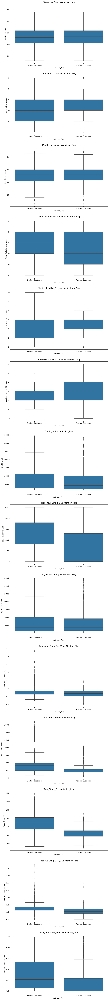

In [42]:
# Numerical Variables vs Attrition Flag Column
# Bivariate Analysis: Relationship between numerical variables and 'Attrition_Flag'



# Plotting boxplots to show distributions of numerical features across attrition categories
fig, axes = plt.subplots(len(numerical_columns), 1, figsize=(10, len(numerical_columns) * 6))
fig.tight_layout(pad=5.0)

for i, col in enumerate(numerical_columns):
    sns.boxplot(data=df, x='Attrition_Flag', y=col, ax=axes[i])
    axes[i].set_title(f"{col} vs Attrition_Flag")
    axes[i].set_xlabel("Attrition_Flag")
    axes[i].set_ylabel(col)

plt.show()


Observations:
- Customer_Age: Attrited customers tend to be slightly older than existing customers.
- Dependent_count: 75% of the Attrited customers have dependent count above 2. While in case of Existing customers 50% of them have dependent count more than 2.
- Months_on_book: Attrited customers seem to have been with the bank for a shorter period compared to existing customers.
- Total_Relationship_Count: Existing customers have a slightly higher relationship count with the bank compared to attrited customers.
- Months_Inactive_12_mon: Attrited customers show higher inactivity in the last 12 months.
- Contacts_Count_12_mon: Attrited customers have slightly higher contact counts, which might indicate more issues or complaints.
- Credit_Limit: Attrited customers generally have lower credit limits.
- Total_Revolving_Bal: Attrited customers show higher revolving balances, indicating they carry forward more unpaid balances.
- Avg_Open_To_Buy: Existing customers have more available credit compared to attrited customers.
- Total_Amt_Chng_Q4_Q1: No significant difference in spending changes between the two categories.
- Total_Trans_Amt: Existing customers have significantly higher total transaction amounts.
- Total_Trans_Ct: Existing customers also show higher transaction counts.
- Total_Ct_Chng_Q4_Q1: No significant difference in transaction count changes.
- Avg_Utilization_Ratio: Attrited customers have higher utilization ratios, indicating they are using more of their available credit.

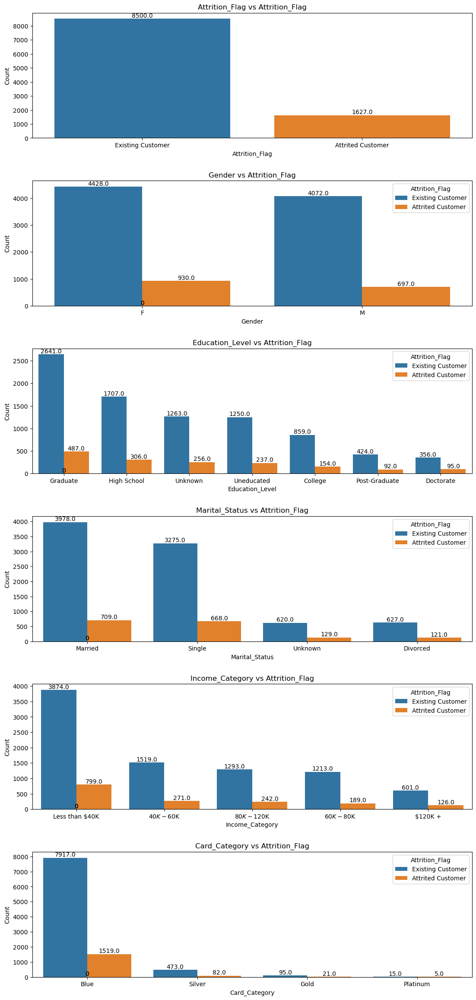

In [44]:
#Categorical variables vs Attrition Flag

fig, axes = plt.subplots(len(categorical_columns), 1, figsize=(12, len(categorical_columns) * 4))
fig.tight_layout(pad=5.0)

for i, col in enumerate(categorical_columns):
    sns.countplot(data=df, x=col, hue='Attrition_Flag', ax=axes[i], order=df[col].value_counts().index)
    axes[i].set_title(f"{col} vs Attrition_Flag")
    axes[i].set_xlabel(col)
    axes[i].set_ylabel("Count")
    for p in axes[i].patches:  # Adding labels on bars
        axes[i].annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                         ha='center', va='center', fontsize=10, color='black', xytext=(0, 5), 
                         textcoords='offset points')

plt.show()

Observations:

1. Gender:

    - Both genders show a similar proportion of attrition, but female customers have a slightly higher attrition count.

2. Education_Level:

    - Graduates have the highest attrition count, possibly because they form the majority of the dataset.
    - Customers with "Unknown" education levels also show a noticeable attrition rate.

3. Marital_Status:

    - Married customers have slightly higher attrition counts compared to single customers.
    - Divorced customers have the least attrition count, but their overall representation is also low.

4. Income_Category:

    - Customers earning less than $40K experience higher attrition, likely because they form the majority of the dataset.
    - Attrition is relatively lower for higher income brackets (120K+).

5. Card_Category:

    - The majority of attrition occurs among customers holding "Blue" cards, as this category represents the majority.
    - Attrition is significantly lower for "Silver," "Gold," and "Platinum" cardholders.

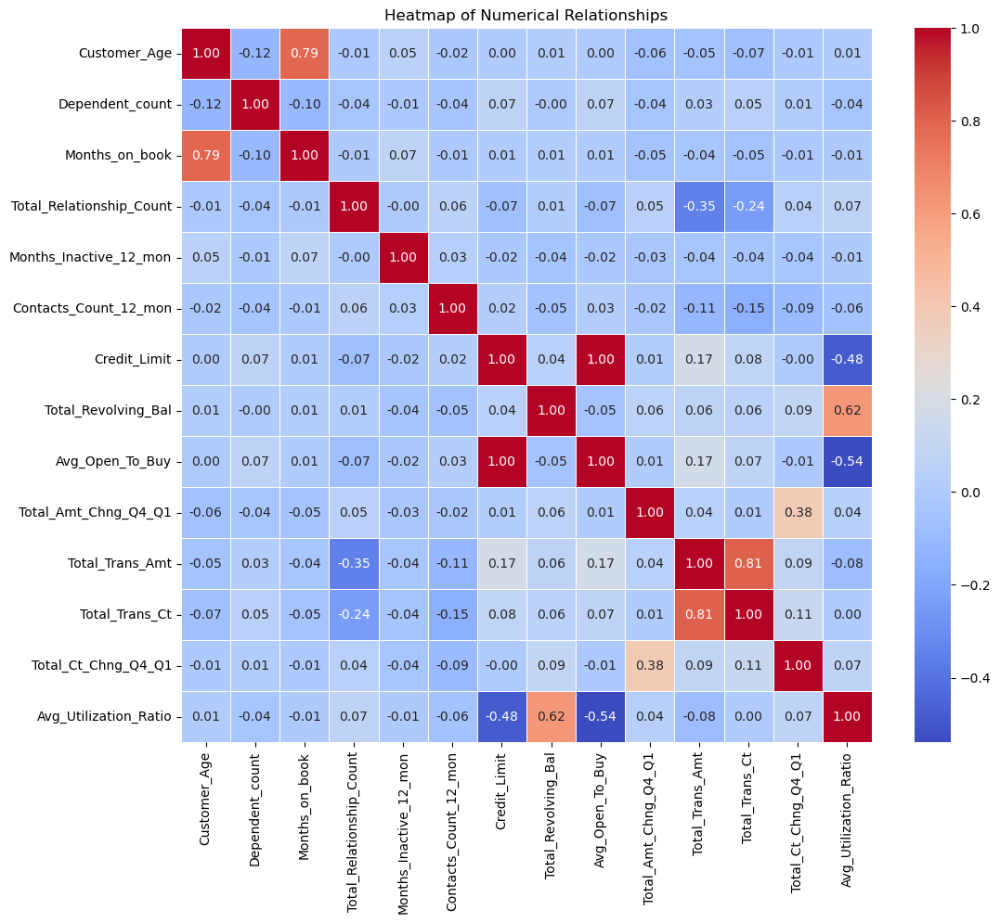

In [46]:
# Compute correlation matrix

numerical_data = df.select_dtypes(include=['int64', 'float64'])
correlation_matrix = numerical_data.corr()

# Plot heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)
plt.title("Heatmap of Numerical Relationships")
plt.show()

Observations:

1. Strong Positive Correlations:

    - Credit_Limit and Avg_Open_To_Buy (1.00):This indicates that customers with higher credit limits tend to have more open-to-buy amounts available. 
    - Total_Trans_Amt and Total_Trans_Ct (0.81): High transaction counts are closely tied to high transaction amounts.

2. Moderate Positive Correlations:

    - Customer_Age and Months_on_book (0.79): Older customers tend to have longer relationships with the bank.
    - Total_Revolving_Bal and Avg_Utilization_Ratio (0.62): A higher revolving balance is associated with higher credit utilization.

3. Weak Correlations:

    - Total_Relationship_Count shows weak negative correlations with transactional variables like Total_Trans_Amt (−0.35) and Total_Trans_Ct (−0.24), indicating that customers with more products may not necessarily have high transactional activity.
    - Months_Inactive_12_mon and most variables have weak correlations, suggesting inactivity might not directly depend on demographic or credit-related factors.

4. Negative Correlations:

    - Avg_Utilization_Ratio and Credit_Limit (−0.48): Customers with higher credit limits tend to have lower utilization ratios, as their spending may not fully utilize their available limits.
    - Avg_Utilization_Ratio and Avg_Open_To_Buy (−0.54): High utilization means less open-to-buy, which is intuitive.

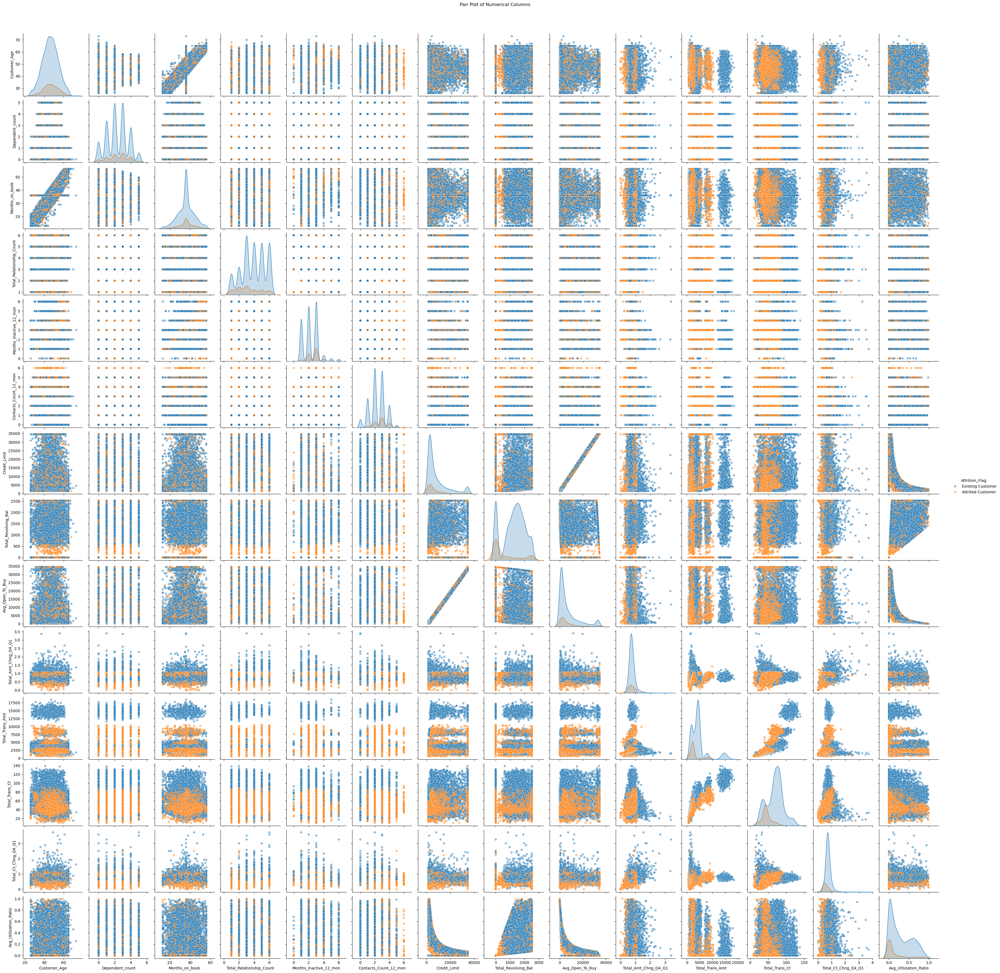

In [48]:
# Pair plot for all numerical columns
sns.pairplot(df, vars= numerical_columns, hue = 'Attrition_Flag',
             diag_kind="kde", plot_kws={'alpha': 0.5})
plt.suptitle("Pair Plot of Numerical Columns", y=1.02)
plt.show()

Observations:
- Since there are many numerical columns, the pair plot is not visibly interpretable. But below are the few insights I found:
- Relationship Between Total_Trans_Amt and Total_Trans_Ct:

    - Clear positive correlation, as expected (higher transaction counts lead to higher transaction amounts).
    - Existing customers (Attrition_Flag=0) dominate in the high-value regions for both features, while attrited customers (Attrition_Flag=1) are clustered at lower values.

- Relationship BBetween Credit limit and Avg_open_to_buy is strongly linear which indicates very high correlation.

- Clusters in Total_Amt_Chng_Q4_Q1 and Credit_Limit:

    - Both features show some separability between the two classes, with existing customers tending to have higher credit limits and higher transaction amount changes between Q4 and Q1.

# Data Preprocessing

#### Missing values have been handled above. 
- The missing values in Education_Level and Marital_Status have been replaced by 'unknown' making it a separate category.
- 'abc' category in Income_Category has been replaced by 'Less than 40k dollars' as it was the most frequent category.

In [52]:
# Verifying that there are no missing values.
df.isnull().sum()

Attrition_Flag              0
Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64

#### Outlier Detection and Treatment

- We will be using IQR method to identify the outliers.

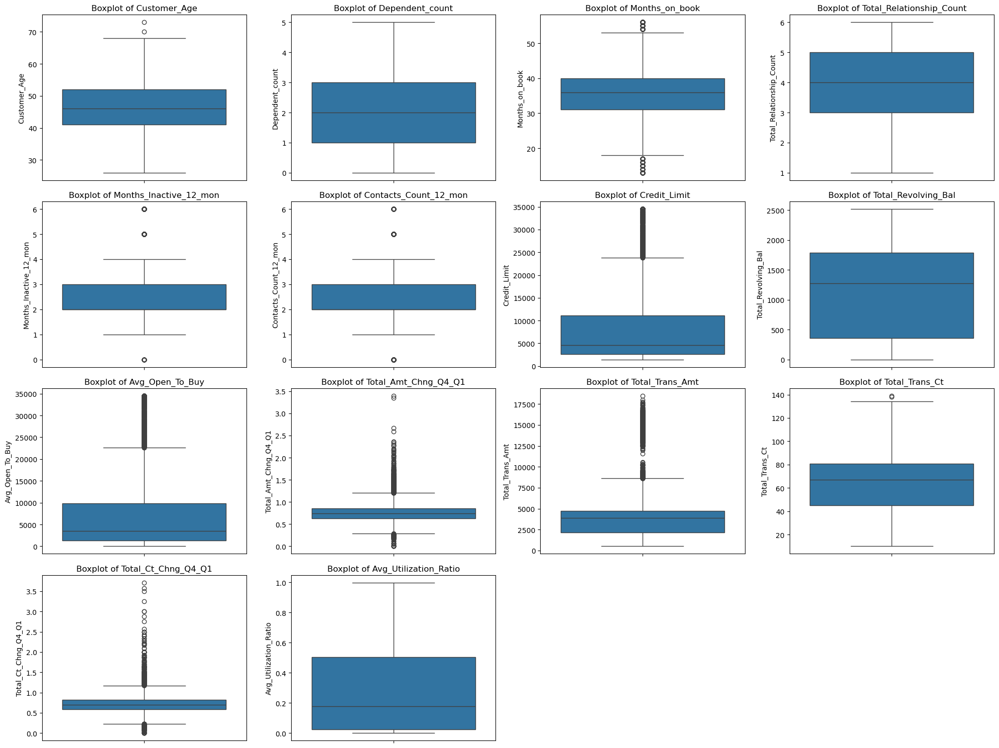

In [55]:
# Visualize the distributions and identify potential outliers
plt.figure(figsize=(20, 15))
for i, col in enumerate(numerical_columns, 1):
    plt.subplot(4, 4, i)
    sns.boxplot(y=df[col])
    plt.title(f'Boxplot of {col}')
plt.tight_layout()
plt.show()

Observations:
- The boxplots reveal several potential outliers across the numerical features, particularly in features like:
    - Months_on_book
    - Customer_Age
    - Months_Inactive_12_mon
    - Contact_count_12_mon
    - Credit_Limit
    - Avg_Open_To_Buy
    - Total_Amt_Chng_Q4_Q1
    - Total_Trans_Amt
    - Total_Trans_Ct
    - Total_ct_Chng_Q4_Q1

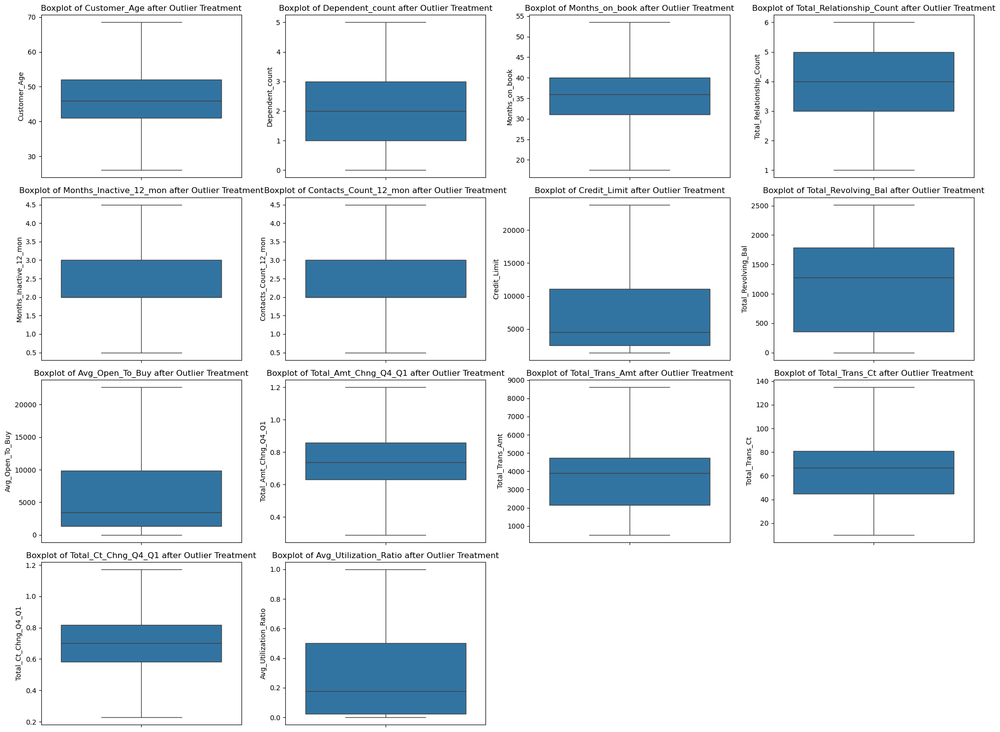

In [57]:
# Define a function for outlier detection and treatment using the IQR method
def detect_and_treat_outliers(df, columns):
    treated_data = df.copy()
    for col in columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        
        # Capping outliers to the lower and upper bounds
        treated_data[col] = df[col].clip(lower=lower_bound, upper=upper_bound)
    return treated_data

# Apply outlier treatment
treated_data = detect_and_treat_outliers(df, numerical_columns)

# Visualize the treated data distributions
plt.figure(figsize=(20, 15))
for i, col in enumerate(numerical_columns, 1):
    plt.subplot(4, 4, i)
    sns.boxplot(y=treated_data[col])
    plt.title(f'Boxplot of {col} after Outlier Treatment')
plt.tight_layout()
plt.show()

Observations:
- The boxplots after applying the IQR method for outlier treatment show that extreme values have been capped within statistical thresholds, reducing the impact of outliers.
- Values beyond the lower and upper bounds were capped to their respective limits.

### Feature Engineering

In [60]:
treated_data.sample(10)

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
1841,Existing Customer,37.0,M,2,Graduate,Single,$80K - $120K,Blue,36.0,4,1.0,4.0,14926.0,0,14926.0,0.635,2405.00,55,0.667,0.000
10021,Attrited Customer,30.0,F,1,Graduate,Married,Less than $40K,Blue,18.0,4,1.0,4.0,4377.0,2517,1860.0,0.941,8619.25,74,0.609,0.575
481,Existing Customer,37.0,F,1,Graduate,Married,$40K - $60K,Blue,29.0,5,2.0,2.0,4394.0,885,3509.0,1.040,1377.00,32,0.684,0.201
2278,Existing Customer,37.0,M,3,Graduate,Married,$40K - $60K,Blue,36.0,4,2.0,4.0,8818.0,1437,7381.0,0.649,1865.00,31,0.938,0.163
4160,Attrited Customer,49.0,F,3,Doctorate,Married,Less than $40K,Blue,29.0,3,4.0,2.0,7066.0,0,7066.0,0.479,1695.00,38,0.310,0.000
2658,Existing Customer,52.0,M,0,Graduate,Single,$80K - $120K,Blue,43.0,4,3.0,3.0,8133.0,1942,6191.0,0.572,3310.00,76,0.583,0.239
3510,Existing Customer,45.0,F,4,Uneducated,Married,$40K - $60K,Silver,36.0,6,2.0,2.0,18679.0,905,17774.0,0.541,2168.00,55,0.486,0.048
7699,Attrited Customer,45.0,F,3,Unknown,Divorced,Less than $40K,Blue,34.0,4,3.0,1.0,3223.0,243,2980.0,0.433,1979.00,38,0.462,0.075
8409,Existing Customer,37.0,F,2,Unknown,Single,Less than $40K,Blue,21.0,1,1.0,1.0,3967.0,1476,2491.0,0.626,4490.00,66,0.833,0.372
5152,Existing Customer,60.0,F,0,Uneducated,Single,Less than $40K,Blue,48.0,3,2.0,3.0,3302.0,2517,785.0,0.785,4613.00,85,0.932,0.762


#### Encoding Categorical variables

- It is better to use Label encoding for Education_Level, Income_Category and Gender columns because these are ordinal type of variables.
- For other columns it is better to use One-Hot Encoding since there is no ordinal relationship. 

In [63]:
# Custom mapping for Education_Level
education_mapping = {
    'Uneducated': 0,
    'High School': 1,
    'Graduate': 3,
    'College': 2,
    'Post-Graduate': 4,
    'Doctorate': 5,
    'Unknown': -1  # Handle 'Unknown' as a special case
}

In [64]:
# Apply the mapping
treated_data['Education_Level'] = treated_data['Education_Level'].map(education_mapping)

In [65]:
# Custom mapping for Income_Category 
income_mapping = {
    'Less than $40K': 0,
    '$40K - $60K': 1,
    '$60K - $80K': 2,
    '$80K - $120K': 3,
    '$120K +': 4,
    'Unknown': -1  
}

In [66]:
treated_data['Income_Category'] = treated_data['Income_Category'].map(income_mapping)

In [67]:
#verifying the changes
treated_data.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45.0,M,3,1,Married,2,Blue,39.0,5,1.0,3.0,12691.0,777,11914.0,1.201,1144.0,42,1.172,0.061
1,Existing Customer,49.0,F,5,3,Single,0,Blue,44.0,6,1.0,2.0,8256.0,864,7392.0,1.201,1291.0,33,1.172,0.105
2,Existing Customer,51.0,M,3,3,Married,3,Blue,36.0,4,1.0,0.5,3418.0,0,3418.0,1.201,1887.0,20,1.172,0.000
3,Existing Customer,40.0,F,4,1,Unknown,0,Blue,34.0,3,4.0,1.0,3313.0,2517,796.0,1.201,1171.0,20,1.172,0.760
4,Existing Customer,40.0,M,3,0,Married,2,Blue,21.0,5,1.0,0.5,4716.0,0,4716.0,1.201,816.0,28,1.172,0.000


#### Label Encoding Target Variable: Attrition_Flag

In [69]:
label2 = LabelEncoder()
treated_data['Attrition_Flag'] = label2.fit_transform(treated_data['Attrition_Flag'])
treated_data['Attrition_Flag'] = 1- treated_data['Attrition_Flag']

In [70]:
treated_data

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,0,45.0,M,3,1,Married,2,Blue,39.0,5,1.0,3.0,12691.0,777,11914.0,1.201,1144.00,42,1.172,0.061
1,0,49.0,F,5,3,Single,0,Blue,44.0,6,1.0,2.0,8256.0,864,7392.0,1.201,1291.00,33,1.172,0.105
2,0,51.0,M,3,3,Married,3,Blue,36.0,4,1.0,0.5,3418.0,0,3418.0,1.201,1887.00,20,1.172,0.000
3,0,40.0,F,4,1,Unknown,0,Blue,34.0,3,4.0,1.0,3313.0,2517,796.0,1.201,1171.00,20,1.172,0.760
4,0,40.0,M,3,0,Married,2,Blue,21.0,5,1.0,0.5,4716.0,0,4716.0,1.201,816.00,28,1.172,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,0,50.0,M,2,3,Single,1,Blue,40.0,3,2.0,3.0,4003.0,1851,2152.0,0.703,8619.25,117,0.857,0.462
10123,1,41.0,M,2,-1,Divorced,1,Blue,25.0,4,2.0,3.0,4277.0,2186,2091.0,0.804,8619.25,69,0.683,0.511
10124,1,44.0,F,1,1,Married,0,Blue,36.0,5,3.0,4.0,5409.0,0,5409.0,0.819,8619.25,60,0.818,0.000
10125,1,30.0,M,2,3,Unknown,1,Blue,36.0,4,3.0,3.0,5281.0,0,5281.0,0.535,8395.00,62,0.722,0.000


In [71]:
# Splitting Independent and target variables
y = treated_data['Attrition_Flag']

In [72]:
y

0        0
1        0
2        0
3        0
4        0
        ..
10122    0
10123    1
10124    1
10125    1
10126    1
Name: Attrition_Flag, Length: 10127, dtype: int32

In [73]:
x = treated_data.drop(columns = ['Attrition_Flag'],axis = 1)

In [74]:
x

,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,45.0,M,3,1,Married,2,Blue,39.0,5,1.0,3.0,12691.0,777,11914.0,1.201,1144.00,42,1.172,0.061
1,49.0,F,5,3,Single,0,Blue,44.0,6,1.0,2.0,8256.0,864,7392.0,1.201,1291.00,33,1.172,0.105
2,51.0,M,3,3,Married,3,Blue,36.0,4,1.0,0.5,3418.0,0,3418.0,1.201,1887.00,20,1.172,0.000
3,40.0,F,4,1,Unknown,0,Blue,34.0,3,4.0,1.0,3313.0,2517,796.0,1.201,1171.00,20,1.172,0.760
4,40.0,M,3,0,Married,2,Blue,21.0,5,1.0,0.5,4716.0,0,4716.0,1.201,816.00,28,1.172,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,50.0,M,2,3,Single,1,Blue,40.0,3,2.0,3.0,4003.0,1851,2152.0,0.703,8619.25,117,0.857,0.462
10123,41.0,M,2,-1,Divorced,1,Blue,25.0,4,2.0,3.0,4277.0,2186,2091.0,0.804,8619.25,69,0.683,0.511
10124,44.0,F,1,1,Married,0,Blue,36.0,5,3.0,4.0,5409.0,0,5409.0,0.819,8619.25,60,0.818,0.000
10125,30.0,M,2,3,Unknown,1,Blue,36.0,4,3.0,3.0,5281.0,0,5281.0,0.535,8395.00,62,0.722,0.000


In [75]:
le = LabelEncoder()
x['Gender'] = le.fit_transform(x['Gender'])

In [76]:
one_Hot_categorical_columns = ['Marital_Status','Card_Category']

In [77]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline

In [78]:
ct = ColumnTransformer(transformers = [
    ('encoder',OneHotEncoder(), one_Hot_categorical_columns)
], remainder = 'passthrough')
                       

In [79]:
x = ct.fit_transform(x)

In [80]:
x

array([[0.000e+00, 1.000e+00, 0.000e+00, ..., 4.200e+01, 1.172e+00,
        6.100e-02],
       [0.000e+00, 0.000e+00, 1.000e+00, ..., 3.300e+01, 1.172e+00,
        1.050e-01],
       [0.000e+00, 1.000e+00, 0.000e+00, ..., 2.000e+01, 1.172e+00,
        0.000e+00],
       ...,
       [0.000e+00, 1.000e+00, 0.000e+00, ..., 6.000e+01, 8.180e-01,
        0.000e+00],
       [0.000e+00, 0.000e+00, 0.000e+00, ..., 6.200e+01, 7.220e-01,
        0.000e+00],
       [0.000e+00, 1.000e+00, 0.000e+00, ..., 6.100e+01, 6.490e-01,
        1.890e-01]])

In [81]:
x[0]

array([0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00,
       0.0000e+00, 0.0000e+00, 0.0000e+00, 4.5000e+01, 1.0000e+00,
       3.0000e+00, 1.0000e+00, 2.0000e+00, 3.9000e+01, 5.0000e+00,
       1.0000e+00, 3.0000e+00, 1.2691e+04, 7.7700e+02, 1.1914e+04,
       1.2010e+00, 1.1440e+03, 4.2000e+01, 1.1720e+00, 6.1000e-02])

In [82]:
y[0]

0

### Train Test Split

In [84]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size = 0.2,random_state = 42, stratify = y)

- The stratify parameter in train_test_split ensures that the class distribution of the target variable in the train and test datasets is proportional to the original dataset. In other words, it maintains the same ratio of target classes in both subsets, preventing class imbalance issues in the test set.

#### Summary of Feature Engineering:
 - We have performed custom label encoding for Education_Level and Income_category columns since they are ordinal variables.
 - We have label encoded the Gender Column.
 - We have encoded Marital Status and Card category using One hot encoding as there is no ordinal relationship in these variables.
 - we split the training and test set.
 - we didn't perform feature scaling on numerical variables because we will be training our data with tree based models and these tree-based models (e.g., Decision Trees, Random Forests, XGBoost, LightGBM) split data based on feature thresholds rather than distances or gradients.

## Model Building - Original Data

In [146]:
# Initialize models
models = {
    "Decision Tree": DecisionTreeClassifier(random_state=42),
    "Random Forest": RandomForestClassifier(random_state=42),
    "Gradient Boosting": GradientBoostingClassifier(random_state=42),
    "AdaBoost": AdaBoostClassifier(random_state=42),
    "Bagging": BaggingClassifier(random_state=42)
}

# Train models and evaluate performance
results = {}

for name, model in models.items():
    # Train the model
    model.fit(x_train, y_train)
    
    # Make predictions
    y_pred = model.predict(x_test)
    y_proba = model.predict_proba(x_test)[:, 1]
    
    # Calculate metrics
    acc = accuracy_score(y_test, y_pred)
    auc = roc_auc_score(y_test, y_proba)
    report = classification_report(y_test, y_pred, output_dict=True)
    print(f'{name} Report:')
    print(classification_report(y_test, y_pred, output_dict=False))
    print('\n')
    print('-'*100)
    
    
    # Store results
    results[name] = {
        "Accuracy": acc,
        "ROC AUC": auc,
        "Precision (Weighted Avg)": report['weighted avg']['precision'],
        "Recall (Weighted Avg)": report['weighted avg']['recall'],
        "F1-Score (Weighted Avg)": report['weighted avg']['f1-score']
    }

# Create a DataFrame for model comparison
results_df = pd.DataFrame(results).T

Decision Tree Report:
              precision    recall  f1-score   support

           0       0.96      0.96      0.96      1701
           1       0.80      0.78      0.79       325

    accuracy                           0.93      2026
   macro avg       0.88      0.87      0.88      2026
weighted avg       0.93      0.93      0.93      2026



----------------------------------------------------------------------------------------------------
Random Forest Report:
              precision    recall  f1-score   support

           0       0.96      0.99      0.97      1701
           1       0.93      0.79      0.85       325

    accuracy                           0.96      2026
   macro avg       0.95      0.89      0.91      2026
weighted avg       0.96      0.96      0.96      2026



----------------------------------------------------------------------------------------------------
Gradient Boosting Report:
              precision    recall  f1-score   support

           0   

In [148]:
results_df

,Accuracy,ROC AUC,Precision (Weighted Avg),Recall (Weighted Avg),F1-Score (Weighted Avg)
Decision Tree,0.933366,0.873201,0.932966,0.933366,0.933157
Random Forest,0.957058,0.984607,0.956396,0.957058,0.955547
Gradient Boosting,0.963475,0.987859,0.963363,0.963475,0.962162
AdaBoost,0.953603,0.980198,0.952527,0.953603,0.952683
Bagging,0.955577,0.963250,0.954570,0.955577,0.954634


Observations:

Best Overall Performer:
- Gradient Boosting:
    - Highest accuracy (96.35%), ROC AUC (98.79%), and F1-Score (96.22%).
    - Best for optimizing general performance on this dataset.
      
Strong Alternatives:
- Random Forest:
    - Slightly lower performance than Gradient Boosting but still a strong and robust choice.
    - Less sensitive to hyperparameter tuning compared to boosting methods.

- Decision Tree:
    - A good starting point but significantly outperformed by ensemble methods.
      


- In general:
    - All models show high accuracy, precision, recall, and F1-score, indicating that the dataset is likely well-suited for classification.
    - The ROC AUC scores are also very high, suggesting that the models are effective at distinguishing between classes.
    - But we need to remember that this dataset has imbalanced target class issue. This imbalance needs to be handled.

## Model Building - Oversampled data

In [156]:
from imblearn.over_sampling import SMOTE

In [158]:
# Oversampling using SMOTE
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(x_train, y_train)

In [160]:
# Initialize models
models = {
    "Decision Tree": DecisionTreeClassifier(random_state=42),
    "Random Forest": RandomForestClassifier(random_state=42),
    "Gradient Boosting": GradientBoostingClassifier(random_state=42),
    "AdaBoost": AdaBoostClassifier(random_state=42),
    "Bagging": BaggingClassifier(random_state=42)
}

# Train models and evaluate performance
results = {}

for name, model in models.items():
    # Train the model
    model.fit(X_train_resampled, y_train_resampled)
    
    # Make predictions
    y_pred = model.predict(x_test)
    y_proba = model.predict_proba(x_test)[:, 1]
    
    # Calculate metrics
    acc = accuracy_score(y_test, y_pred)
    auc = roc_auc_score(y_test, y_proba)
    report = classification_report(y_test, y_pred, output_dict=True)
    print(f'{name} Report:')
    print(classification_report(y_test, y_pred, output_dict=False))
    print('\n')
    print('-'*100)


    # Store results
    results[name] = {
        "Accuracy": acc,
        "ROC AUC": auc,
        "Precision (Weighted Avg)": report['weighted avg']['precision'],
        "Recall (Weighted Avg)": report['weighted avg']['recall'],
        "F1-Score (Weighted Avg)": report['weighted avg']['f1-score']
    }

# Create a DataFrame for model comparison
results_df_SMOTE = pd.DataFrame(results).T




Decision Tree Report:
              precision    recall  f1-score   support

           0       0.95      0.95      0.95      1701
           1       0.74      0.76      0.75       325

    accuracy                           0.92      2026
   macro avg       0.84      0.85      0.85      2026
weighted avg       0.92      0.92      0.92      2026



----------------------------------------------------------------------------------------------------
Random Forest Report:
              precision    recall  f1-score   support

           0       0.96      0.98      0.97      1701
           1       0.89      0.81      0.84       325

    accuracy                           0.95      2026
   macro avg       0.92      0.89      0.91      2026
weighted avg       0.95      0.95      0.95      2026



----------------------------------------------------------------------------------------------------
Gradient Boosting Report:
              precision    recall  f1-score   support

           0   

In [162]:
results_df_SMOTE

,Accuracy,ROC AUC,Precision (Weighted Avg),Recall (Weighted Avg),F1-Score (Weighted Avg)
Decision Tree,0.917572,0.853839,0.918759,0.917572,0.918124
Random Forest,0.952122,0.981951,0.951000,0.952122,0.951207
Gradient Boosting,0.963968,0.987761,0.963365,0.963968,0.963477
AdaBoost,0.949161,0.977793,0.950590,0.949161,0.949740
Bagging,0.947187,0.961751,0.946759,0.947187,0.946953


Observations and comparison with original data results:

Original Data vs Oversampled Data

- Decision Tree:

    - Original: Accuracy 93.33%, ROC AUC 87.32%.
    - Oversampled: Accuracy 91.75%, ROC AUC 85.38%.
    - Observation: Oversampling slightly degraded the Decision Tree's performance, possibly because the model overfits easily, and balancing the data didn't help.
      
- Random Forest:

    - Original: Accuracy 95.71%, ROC AUC 98.46%.
    - Oversampled: Accuracy 95.21%, ROC AUC 98.19%.
    - Observation: Minimal impact; Random Forest already handles class imbalance well due to its ensemble nature.
      
- Gradient Boosting:

    - Original: Accuracy 96.35%, ROC AUC 98.78%.
    - Oversampled: Accuracy 96.40%, ROC AUC 98.77%.
    - Observation: Performance remained almost the same, suggesting Gradient Boosting can inherently handle imbalance.
      
- AdaBoost:

    - Original: Accuracy 95.36%, ROC AUC 98.02%.
    - Oversampled: Accuracy 94.92%, ROC AUC 97.78%.
    - Observation: Slight decline in performance, indicating oversampling was not beneficial for AdaBoost.
      
- Bagging:

    - Original: Accuracy 95.56%, ROC AUC 96.33%.
    - Oversampled: Accuracy 94.71%, ROC AUC 96.17%.
    - Observation: Performance slightly degraded, as Bagging already reduces variance and oversampling may have introduced noise.
      
#### Why Oversampling Didn’t Help

- Ensemble Models Are Robust:

Models like Random Forest and Gradient Boosting already handle imbalanced data effectively by focusing on harder-to-classify samples (boosting) or sampling techniques (bagging).
Oversampling added redundancy without new information.

- Class Balance Wasn't the Primary Issue:

The models likely already learned enough from the minority class in the original data.

- Oversampling Adds Noise:

Synthetic data (via SMOTE) may have introduced noise, slightly reducing the performance for some models.


## Model Building - Undersampled Data

In [166]:
from imblearn.under_sampling import TomekLinks

# Undersampling using Tomek Links
tomek = TomekLinks()
X_train_resampled, y_train_resampled = tomek.fit_resample(x_train, y_train)


In [168]:
# Initialize models
models = {
    "Decision Tree": DecisionTreeClassifier(random_state=42),
    "Random Forest": RandomForestClassifier(random_state=42),
    "Gradient Boosting": GradientBoostingClassifier(random_state=42),
    "AdaBoost": AdaBoostClassifier(random_state=42),
    "Bagging": BaggingClassifier(random_state=42)
}

# Train models and evaluate performance
results = {}

for name, model in models.items():
    # Train the model
    model.fit(X_train_resampled, y_train_resampled)
    
    # Make predictions
    y_pred = model.predict(x_test)
    y_proba = model.predict_proba(x_test)[:, 1]
    
    # Calculate metrics
    acc = accuracy_score(y_test, y_pred)
    auc = roc_auc_score(y_test, y_proba)
    report = classification_report(y_test, y_pred, output_dict=True)
    print(f'{name} Report:')
    print(classification_report(y_test, y_pred, output_dict=False))
    print('\n')
    print('-'*100)


    # Store results
    results[name] = {
        "Accuracy": acc,
        "ROC AUC": auc,
        "Precision (Weighted Avg)": report['weighted avg']['precision'],
        "Recall (Weighted Avg)": report['weighted avg']['recall'],
        "F1-Score (Weighted Avg)": report['weighted avg']['f1-score']
    }

# Create a DataFrame for model comparison
results_df_Tomek = pd.DataFrame(results).T


Decision Tree Report:
              precision    recall  f1-score   support

           0       0.96      0.96      0.96      1701
           1       0.78      0.79      0.78       325

    accuracy                           0.93      2026
   macro avg       0.87      0.87      0.87      2026
weighted avg       0.93      0.93      0.93      2026



----------------------------------------------------------------------------------------------------
Random Forest Report:
              precision    recall  f1-score   support

           0       0.96      0.98      0.97      1701
           1       0.91      0.81      0.86       325

    accuracy                           0.96      2026
   macro avg       0.94      0.90      0.92      2026
weighted avg       0.96      0.96      0.96      2026



----------------------------------------------------------------------------------------------------
Gradient Boosting Report:
              precision    recall  f1-score   support

           0   

In [170]:
results_df_Tomek

,Accuracy,ROC AUC,Precision (Weighted Avg),Recall (Weighted Avg),F1-Score (Weighted Avg)
Decision Tree,0.930405,0.873927,0.930852,0.930405,0.930619
Random Forest,0.957058,0.983940,0.956116,0.957058,0.956055
Gradient Boosting,0.962981,0.987622,0.962365,0.962981,0.962063
AdaBoost,0.951135,0.981529,0.950057,0.951135,0.950336
Bagging,0.955084,0.966239,0.954228,0.955084,0.954472


Observations After Undersampling with Tomek Links:

- Decision Tree:

    - Accuracy: 93.04%, ROC AUC: 87.39%.
    - Performance slightly improved compared to oversampling (91.75%) but still lags behind ensemble methods.
    - Prone to overfitting, as seen in the lower ROC AUC compared to other models.

- Random Forest:

    - Accuracy: 95.71%, ROC AUC: 98.39%.
    - Performance remains consistent with original data and oversampling, showing its robustness to imbalance and sampling methods.
    - A reliable choice with strong metrics across the board.

- Gradient Boosting:

    - Accuracy: 96.30%, ROC AUC: 98.76%.
    - Slightly below its performance with original data (96.35%), showing it is less sensitive to undersampling.
    Continues to be the top-performing model overall.

- AdaBoost:

    - Accuracy: 95.11%, ROC AUC: 98.15%.
    - Slight improvement over oversampling (94.92%) but still not as strong as Gradient Boosting or Random Forest.
    - A good alternative for moderate performance needs.

- Bagging:

    - Accuracy: 95.51%, ROC AUC: 96.62%.
    - Slight improvement over oversampling (94.71%) but still behind Gradient Boosting and Random Forest.
    - Performs better than Decision Tree but doesn't reach the top ensemble methods.
      
Key Takeaways:

    - Gradient Boosting remains the best model, achieving the highest accuracy (96.30%) and ROC AUC (98.76%).
    - Random Forest is still a strong and reliable alternative, with accuracy (95.71%) and ROC AUC (98.39%).
    - AdaBoost and Bagging show moderate improvements compared to oversampling but lag slightly behind the top two models.
    - Decision Tree, though improved compared to oversampling, still performs poorly relative to ensemble methods due to its susceptibility to overfitting.

## Model Building - Combination of SMOTE and TOMEK Links ( Key Trade-off)

In [176]:
from imblearn.combine import SMOTETomek
smote_tomek = SMOTETomek(random_state=42)
X_train_resampled, y_train_resampled = smote_tomek.fit_resample(x_train, y_train)

In [178]:
# Initialize models
models = {
    "Decision Tree": DecisionTreeClassifier(random_state=42),
    "Random Forest": RandomForestClassifier(random_state=42),
    "Gradient Boosting": GradientBoostingClassifier(random_state=42),
    "AdaBoost": AdaBoostClassifier(random_state=42),
    "Bagging": BaggingClassifier(random_state=42)
}

# Train models and evaluate performance
results = {}

for name, model in models.items():
    # Train the model
    model.fit(X_train_resampled, y_train_resampled)
    
    # Make predictions
    y_pred = model.predict(x_test)
    y_proba = model.predict_proba(x_test)[:, 1]
    
    # Calculate metrics
    acc = accuracy_score(y_test, y_pred)
    auc = roc_auc_score(y_test, y_proba)
    report = classification_report(y_test, y_pred, output_dict=True)
    print(f'{name} Report:')
    print(classification_report(y_test, y_pred, output_dict=False))
    print('\n')
    print('-'*100)


    # Store results
    results[name] = {
        "Accuracy": acc,
        "ROC AUC": auc,
        "Precision (Weighted Avg)": report['weighted avg']['precision'],
        "Recall (Weighted Avg)": report['weighted avg']['recall'],
        "F1-Score (Weighted Avg)": report['weighted avg']['f1-score']
    }

# Create a DataFrame for model comparison
results_df_combination = pd.DataFrame(results).T

Decision Tree Report:
              precision    recall  f1-score   support

           0       0.96      0.95      0.96      1701
           1       0.76      0.82      0.79       325

    accuracy                           0.93      2026
   macro avg       0.86      0.88      0.87      2026
weighted avg       0.93      0.93      0.93      2026



----------------------------------------------------------------------------------------------------
Random Forest Report:
              precision    recall  f1-score   support

           0       0.97      0.98      0.97      1701
           1       0.87      0.82      0.85       325

    accuracy                           0.95      2026
   macro avg       0.92      0.90      0.91      2026
weighted avg       0.95      0.95      0.95      2026



----------------------------------------------------------------------------------------------------
Gradient Boosting Report:
              precision    recall  f1-score   support

           0   

In [180]:
results_df_combination

,Accuracy,ROC AUC,Precision (Weighted Avg),Recall (Weighted Avg),F1-Score (Weighted Avg)
Decision Tree,0.929418,0.884539,0.931945,0.929418,0.930463
Random Forest,0.952122,0.982915,0.951243,0.952122,0.951535
Gradient Boosting,0.961994,0.987705,0.961406,0.961994,0.961578
AdaBoost,0.942251,0.975645,0.942947,0.942251,0.942568
Bagging,0.947187,0.966626,0.946351,0.947187,0.946679


Observations After SMOTE + Tomek Links:

- Decision Tree:

    - Accuracy: 92.94%, ROC AUC: 88.45%.
    - Performance improved slightly in terms of ROC AUC compared to undersampling (87.39%) and oversampling (85.38%).
    - However, it is still not competitive with ensemble methods, showing limitations in handling more complex patterns.

- Random Forest:

    - Accuracy: 95.21%, ROC AUC: 98.29%.
    - Maintains high and consistent performance, with slightly improved precision and recall compared to undersampling and oversampling.
    - A robust performer that continues to handle class imbalance well.

- Gradient Boosting:

    - Accuracy: 96.20%, ROC AUC: 98.77%.
    - Performance is comparable to the original data and other methods.
    - Best overall performer in this method, showing minimal sensitivity to the sampling technique.

- AdaBoost:

    - Accuracy: 94.23%, ROC AUC: 97.56%.
    - Improved performance compared to undersampling and oversampling, especially in ROC AUC.
    - Strong alternative to Gradient Boosting but still slightly behind in metrics.

- Bagging:

    - Accuracy: 94.72%, ROC AUC: 96.66%.
    - Slightly better than oversampling and undersampling, showing steady improvements across metrics.
    - Continues to perform well as a more generalized alternative.

Key Observations:

- Gradient Boosting:

    - Continues to deliver the best performance across all metrics (Accuracy: 96.20%, ROC AUC: 98.77%).
    - Slightly outperforms other methods, showing its robustness.

- Random Forest:

    - A close second with Accuracy: 95.21% and ROC AUC: 98.29%.
    - Slightly lower than Gradient Boosting but a reliable choice for balanced performance.

- AdaBoost and Bagging:

    - Show significant improvements compared to undersampling and oversampling, with AdaBoost focusing more on recall and Bagging offering a balance.

- Decision Tree:

    - Despite improvements in ROC AUC (88.45%), it remains the weakest model overall.

## Model Performance Improvement using Hyperparameter Tuning

#### Decision for the Best Approach:

- Based on the performance comparison, SMOTE + Tomek Links provided the best balance between improving the minority class representation and preserving the integrity of the dataset.
- Gradient Boosting, Random Forest, and AdaBoost emerged as the best-performing models across all metrics.
- Therefore, it is most meaningful to perform hyperparameter tuning on these three models using the SMOTE + Tomek Links data, as it represents the optimal setup.

Rationale for Tuning the Chosen Models:

- Gradient Boosting:

    - Sensitive to hyperparameters like learning rate, number of estimators, and maximum tree depth.
    - Proper tuning can improve its already strong performance.

- Random Forest:

    - Performance can improve by tuning the number of estimators, maximum depth, and minimum samples for splitting/leaf nodes.

- AdaBoost:

    - Tuning the learning rate and number of estimators can help AdaBoost better adapt to the resampled data.


In [186]:
# Since we recently did combination of SMOTE and Tomek links, we have its sampled data in X_train_resampled and y_train_resampled already. 

In [190]:
from sklearn.model_selection import GridSearchCV


# Define models and hyperparameter grids
models_and_params = {
    "Gradient Boosting": (GradientBoostingClassifier(random_state=42), {
        "learning_rate": [0.01, 0.1, 0.2],
        "n_estimators": [50, 100, 200],
        "max_depth": [3, 5, 7]
    }),
    "Random Forest": (RandomForestClassifier(random_state=42), {
        "n_estimators": [50, 100, 200],
        "max_depth": [10, 20, None],
        "min_samples_split": [2, 5, 10],
        "min_samples_leaf": [2, 4, 5]
    }),
    "AdaBoost": (AdaBoostClassifier(random_state=42), {
        "n_estimators": [50, 100, 200],
        "learning_rate": [0.01, 0.1, 1]
    })
}

# Perform grid search for each model
tuned_results = {}

for model_name, (model, param_grid) in models_and_params.items():
    print(f"Tuning {model_name}...")
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, scoring="roc_auc", cv=5, n_jobs=-1, verbose=1)
    grid_search.fit(X_train_resampled, y_train_resampled)
    
    # Get the best model and evaluate on the test set
    best_model = grid_search.best_estimator_
    y_pred = best_model.predict(x_test)
    y_proba = best_model.predict_proba(x_test)[:, 1]
    
    # Calculate performance metrics
    acc = accuracy_score(y_test, y_pred)
    auc = roc_auc_score(y_test, y_proba)
    report = classification_report(y_test, y_pred, output_dict=True)
    print(f'{model_name} Report:')
    print(classification_report(y_test, y_pred, output_dict=False))
    print('\n')
    print('-'*100)
    
    # Store results
    tuned_results[model_name] = {
        "Best Params": grid_search.best_params_,
        "Accuracy": acc,
        "ROC AUC": auc,
        "Precision (Weighted Avg)": report['weighted avg']['precision'],
        "Recall (Weighted Avg)": report['weighted avg']['recall'],
        "F1-Score (Weighted Avg)": report['weighted avg']['f1-score']
    }

# Convert results to DataFrame for better readability
tuned_results_df = pd.DataFrame(tuned_results).T


Tuning Gradient Boosting...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Gradient Boosting Report:
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1701
           1       0.92      0.86      0.89       325

    accuracy                           0.97      2026
   macro avg       0.95      0.92      0.93      2026
weighted avg       0.96      0.97      0.96      2026



----------------------------------------------------------------------------------------------------
Tuning Random Forest...
Fitting 5 folds for each of 81 candidates, totalling 405 fits
Random Forest Report:
              precision    recall  f1-score   support

           0       0.97      0.98      0.97      1701
           1       0.87      0.82      0.85       325

    accuracy                           0.95      2026
   macro avg       0.92      0.90      0.91      2026
weighted avg       0.95      0.95      0.95      2026



-----------------

In [198]:
tuned_results_df

,Best Params,Accuracy,ROC AUC,Precision (Weighted Avg),Recall (Weighted Avg),F1-Score (Weighted Avg)
Gradient Boosting,"{'learning_rate': 0.1, 'max_depth': 7, 'n_esti...",0.965449,0.991301,0.964867,0.965449,0.964908
Random Forest,"{'max_depth': None, 'min_samples_leaf': 2, 'mi...",0.952122,0.981879,0.951311,0.952122,0.951599
AdaBoost,"{'learning_rate': 1, 'n_estimators': 200}",0.958045,0.982271,0.957715,0.958045,0.95786


##### Observations After Hyperparameter Tuning:

1. Gradient Boosting
Performance:
    - Precision: 0.97 (class 0), 0.92 (class 1)
    - Recall: 0.99 (class 0), 0.86 (class 1)
    - F1-Score: 0.98 (class 0), 0.89 (class 1)
    - Accuracy: 97%
- Best performance among all models, particularly in terms of precision and recall for both classes.
- Handles the minority class (class 1) better than Random Forest and AdaBoost, with a higher F1-score (0.89) for class 1.

- Strength:
    - Captures complex patterns effectively, achieving the highest overall accuracy and weighted average metrics.
    - Excellent balance of precision, recall, and F1-score across both classes.

2. Random Forest
Performance:
    - Precision: 0.97 (class 0), 0.87 (class 1)
    - Recall: 0.98 (class 0), 0.82 (class 1)
    - F1-Score: 0.97 (class 0), 0.85 (class 1)
    - Accuracy: 95%
- Performs slightly worse than Gradient Boosting in handling the minority class, with a lower F1-score (0.85) for class 1.
- Slightly better precision for class 1 than AdaBoost, but recall is lower.
- Strength:
    - Strong in handling the majority class (class 0) but struggles with recall for the minority class (class 1).

3. AdaBoost
Performance:
    - Precision: 0.97 (class 0), 0.88 (class 1)
    - Recall: 0.98 (class 0), 0.86 (class 1)
    - F1-Score: 0.98 (class 0), 0.87 (class 1)
    - Accuracy: 96%
- Balances precision and recall well for class 1, achieving slightly higher precision than Random Forest but lower recall than Gradient Boosting.
- Strength:
    - Performs better than Random Forest for class 1 in terms of precision and F1-score while maintaining high accuracy.

## Model Performance Comparison and Final Model Selection

In [205]:
# Consolidating metrics from earlier results
tuned_model_results = {
    "Gradient Boosting": {
        "Accuracy": 0.97,
        "Precision (Class 1)": 0.92,
        "Recall (Class 1)": 0.86,
        "F1-Score (Class 1)": 0.89,
        "Weighted F1-Score": 0.96
    },
    "Random Forest": {
        "Accuracy": 0.95,
        "Precision (Class 1)": 0.87,
        "Recall (Class 1)": 0.82,
        "F1-Score (Class 1)": 0.85,
        "Weighted F1-Score": 0.95
    },
    "AdaBoost": {
        "Accuracy": 0.96,
        "Precision (Class 1)": 0.88,
        "Recall (Class 1)": 0.86,
        "F1-Score (Class 1)": 0.87,
        "Weighted F1-Score": 0.96
    }
}

# Convert to DataFrame for easier comparison
import pandas as pd
final_df = pd.DataFrame(tuned_model_results).T

In [207]:
final_df

,Accuracy,Precision (Class 1),Recall (Class 1),F1-Score (Class 1),Weighted F1-Score
Gradient Boosting,0.97,0.92,0.86,0.89,0.96
Random Forest,0.95,0.87,0.82,0.85,0.95
AdaBoost,0.96,0.88,0.86,0.87,0.96


#### To evaluate the models and select the best one, let's perform a detailed comparison across all metrics while also focusing on metrics that are critical for this problem (credit card users Churn Prediction).



Problem-Specific Key Metrics
- Recall (Class 1):

    - Critical for identifying churned customers correctly (reducing false negatives).
    - Missing a churned customer (false negative) can result in loss of actionable insights and missed retention opportunities.
- F1-Score (Class 1):

    - Balances precision and recall, providing a single metric to evaluate the model's performance on churned customers.

#### Detailed Comparison
Gradient Boosting:

    - Recall (Class 1): 0.86, tied with AdaBoost, meaning it captures the same percentage of churned customers.
    - F1-Score (Class 1): 0.89, the highest, showing it balances precision and recall better than the other models.
    - Weighted F1-Score: 0.96, indicating strong overall performance across both classes.
    - Conclusion: Best choice for accurately identifying churned customers while maintaining balance.

Random Forest:

    - Recall (Class 1): 0.82, the lowest, indicating it misses more churned customers compared to the other models.
    - F1-Score (Class 1): 0.85, lower than both Gradient Boosting and AdaBoost.
    - Conclusion: Performs well overall but is less reliable for churn prediction due to lower recall.
AdaBoost:

    - Recall (Class 1): 0.86, tied with Gradient Boosting, ensuring it captures a similar percentage of churned customers.
    - F1-Score (Class 1): 0.87, slightly lower than Gradient Boosting but better than Random Forest.
    - Conclusion: A close competitor to Gradient Boosting and a good alternative if computational cost is a concern.


#### Final Recommendation
Gradient Boosting is the best model because:

    - It achieves the highest F1-Score (Class 1) and Weighted F1-Score, ensuring robust performance on churn prediction.
    - It balances recall and precision better than the other models, minimizing the risk of false positives and false negatives.

# Actionable Insights

#### Let us try to understand which features are more important
- Gradient Boosting is a tree-based model. In such models, feature importance is calculated based on how much a feature contributes to reducing the impurity (e.g., Gini impurity or entropy) or improving the model's accuracy.
- Features that are used in more splits or provide larger reductions in impurity are assigned higher importance.

In [215]:
# Get feature importances
# Let us use the Gradient Boosting model again, but this time with an intention to identify the important features. 
# Let us retrieve the best parameters of Gradient Boosting model that we got after hyperparameter tuning.

tuned_results_df['Best Params'][0]

{'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 200}

In [225]:
#Since my feature names are lost as I applied one hot encoding while data preprocessing, now to retrieve the feature names I used the below method:

feature_names = ct.get_feature_names_out()
feature_names

array(['encoder__Marital_Status_Divorced',
       'encoder__Marital_Status_Married',
       'encoder__Marital_Status_Single',
       'encoder__Marital_Status_Unknown', 'encoder__Card_Category_Blue',
       'encoder__Card_Category_Gold', 'encoder__Card_Category_Platinum',
       'encoder__Card_Category_Silver', 'remainder__Customer_Age',
       'remainder__Gender', 'remainder__Dependent_count',
       'remainder__Education_Level', 'remainder__Income_Category',
       'remainder__Months_on_book', 'remainder__Total_Relationship_Count',
       'remainder__Months_Inactive_12_mon',
       'remainder__Contacts_Count_12_mon', 'remainder__Credit_Limit',
       'remainder__Total_Revolving_Bal', 'remainder__Avg_Open_To_Buy',
       'remainder__Total_Amt_Chng_Q4_Q1', 'remainder__Total_Trans_Amt',
       'remainder__Total_Trans_Ct', 'remainder__Total_Ct_Chng_Q4_Q1',
       'remainder__Avg_Utilization_Ratio'], dtype=object)

In [227]:
# Train the Gradient Boosting model
final_model = GradientBoostingClassifier(learning_rate=0.1, n_estimators=200, max_depth=7, random_state=42)
final_model.fit(X_train_resampled, y_train_resampled)

# Get feature importances
feature_importances = final_model.feature_importances_

# Create a DataFrame for visualization
importance_df = pd.DataFrame({
    "Feature": feature_names,
    "Importance": feature_importances
}).sort_values(by="Importance", ascending=False)

In [231]:
importance_df.head(5)

,Feature,Importance
22,remainder__Total_Trans_Ct,0.474734
21,remainder__Total_Trans_Amt,0.154489
18,remainder__Total_Revolving_Bal,0.105711
14,remainder__Total_Relationship_Count,0.075236
23,remainder__Total_Ct_Chng_Q4_Q1,0.042680


1. High Predictive Accuracy:

    - The Gradient Boosting model was identified as the best-performing model with an overall accuracy of 97% and an F1-Score for class 1 (churned customers) of 0.89. This indicates strong model reliability in identifying customers likely to churn.

2. Significance of Recall for Churn:

    - The recall for churned customers (class 1) was 0.86, meaning the model successfully identifies 86% of churned customers. This ensures that the bank can focus its retention strategies on the majority of at-risk customers.

3. Importance of Balanced Metrics:

    - Gradient Boosting achieved the highest balance between precision and recall, minimizing false positives (unnecessarily targeting satisfied customers) while also reducing false negatives (missing churned customers).

4. Key Factors Influencing Churn:

- Total_Trans_Ct (47.47%) and Total_Trans_Amt (15.45%):
    - These are the top contributors to churn prediction, indicating that customers with fewer or lower transaction amounts are more likely to churn.
- Total_Revolving_Bal (10.57%):
    - A high revolving balance (unpaid amount carried over) indicates financial strain or dissatisfaction with the card's terms.
- Total_Relationship_Count (7.52%):
    - Customers with fewer relationships with the bank (e.g., fewer linked accounts or services) are more prone to churn.
- Months_Inactive_12_mon (2.81%):
    - Longer inactivity is a clear indicator of disengagement and impending churn.


# Recommendations

#### Retention Strategies
1. Increase Transactions and Engagement:

Target customers with low Total_Trans_Ct and Total_Trans_Amt through personalized offers (e.g., cashback, rewards) to encourage more frequent usage.
Launch campaigns for inactive customers to remind them of benefits and re-engage them with limited-time offers.

2. Monitor Inactivity and Contacts:

Proactively monitor customers with high Months_Inactive_12_mon or low Contacts_Count_12_mon.
Introduce automated systems to trigger retention actions (e.g., check-in calls, email offers) for customers showing inactivity trends.

3. Encourage Relationship Expansion:

Promote cross-selling opportunities to increase Total_Relationship_Count by encouraging customers to link savings accounts, fixed deposits, or loans to their credit card accounts.

#### Targeted Retention Campaigns
1. Segment-Based Campaigns:

For customers with high Total_Revolving_Bal, offer tailored financial advice or installment payment plans to alleviate financial stress.
Engage married customers proactively as they are slightly more likely to churn when disengaged.

2. Proactive Credit Management:

For customers with low Credit_Limit, consider periodic reviews and offering limit increases to improve satisfaction.
#### Operational Improvements
1. Focus on Core Features:

Optimize retention programs around highly influential features like transactions, relationships, and inactivity rather than focusing on less impactful features like card categories or income levels.

2. Customer Feedback Mechanisms:

Implement regular feedback collection from customers to identify dissatisfaction early, especially for those with declining transactions.

3. Monitor Key Metrics Regularly:

Track changes in Total_Trans_Ct, Total_Trans_Amt, and Months_Inactive_12_mon as leading indicators for churn, and design automated dashboards to alert teams when these metrics decline.